### **Solar Power Perdiction using Linear Regression Model**

##### **Data Collection**

In [1]:
# Import the necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

##### Understand the problem definition and load the required dataset 

In [2]:
# Load the dataset
df = pd.read_csv(r"/Users/mangalayazhini/Desktop/Solar Power Prediction/Dataset/SolarPowerPrediction.csv")

##### Overview of the dataset

In [3]:
# Display the first few rows of the dataset
df.head()

,temperature_2_m_above_gnd,relative_humidity_2_m_above_gnd,mean_sea_level_pressure_MSL,total_precipitation_sfc,snowfall_amount_sfc,total_cloud_cover_sfc,high_cloud_cover_high_cld_lay,medium_cloud_cover_mid_cld_lay,low_cloud_cover_low_cld_lay,shortwave_radiation_backwards_sfc,...,wind_direction_10_m_above_gnd,wind_speed_80_m_above_gnd,wind_direction_80_m_above_gnd,wind_speed_900_mb,wind_direction_900_mb,wind_gust_10_m_above_gnd,angle_of_incidence,zenith,azimuth,generated_power_kw
0,2.17,31,1035.0,0.0,0.0,0.0,0,0,0,0.00,...,312.71,9.36,22.62,6.62,337.62,24.48,58.753108,83.237322,128.33543,454.10095
1,2.31,27,1035.1,0.0,0.0,0.0,0,0,0,1.78,...,294.78,5.99,32.74,4.61,321.34,21.96,45.408585,75.143041,139.65530,1411.99940
2,3.65,33,1035.4,0.0,0.0,0.0,0,0,0,108.58,...,270.00,3.89,56.31,3.76,286.70,14.04,32.848282,68.820648,152.53769,2214.84930
3,5.82,30,1035.4,0.0,0.0,0.0,0,0,0,258.10,...,323.13,3.55,23.96,3.08,339.44,19.80,22.699288,64.883536,166.90159,2527.60920
4,7.73,27,1034.4,0.0,0.0,0.0,0,0,0,375.58,...,10.01,6.76,25.20,6.62,22.38,16.56,19.199908,63.795208,182.13526,2640.20340


In [4]:
# Display the last few rows of the dataset
df.tail()

,temperature_2_m_above_gnd,relative_humidity_2_m_above_gnd,mean_sea_level_pressure_MSL,total_precipitation_sfc,snowfall_amount_sfc,total_cloud_cover_sfc,high_cloud_cover_high_cld_lay,medium_cloud_cover_mid_cld_lay,low_cloud_cover_low_cld_lay,shortwave_radiation_backwards_sfc,...,wind_direction_10_m_above_gnd,wind_speed_80_m_above_gnd,wind_direction_80_m_above_gnd,wind_speed_900_mb,wind_direction_900_mb,wind_gust_10_m_above_gnd,angle_of_incidence,zenith,azimuth,generated_power_kw
4208,8.69,66,1025.1,0.0,0.0,100.0,100,100,100,257.21,...,285.42,25.50,283.06,24.01,282.99,25.20,22.700907,64.952098,167.06794,173.410560
4209,7.57,90,1026.1,0.0,0.0,100.0,79,100,100,210.04,...,6.91,13.00,4.76,11.61,7.13,10.44,19.307487,63.895118,182.28247,403.792220
4210,7.27,90,1026.3,0.1,0.0,100.0,73,100,100,113.92,...,2.29,8.71,352.87,7.95,354.81,22.32,25.249506,65.827032,197.33868,158.367780
4211,8.25,81,1025.5,0.0,0.0,100.0,74,66,100,186.90,...,11.31,6.29,13.24,5.94,14.04,15.48,36.361161,70.496313,211.30027,126.953060
4212,8.00,80,1025.3,0.0,0.0,100.0,100,100,100,172.66,...,12.72,12.07,17.35,11.38,18.43,16.20,48.452849,76.919574,223.04931,20.055031


##### **Data Preprocessing**

In [5]:
# Total number of rows and columns in the dataset
df.shape

(4213, 21)

In [6]:
# Display summary of the dataset
df.describe()

,temperature_2_m_above_gnd,relative_humidity_2_m_above_gnd,mean_sea_level_pressure_MSL,total_precipitation_sfc,snowfall_amount_sfc,total_cloud_cover_sfc,high_cloud_cover_high_cld_lay,medium_cloud_cover_mid_cld_lay,low_cloud_cover_low_cld_lay,shortwave_radiation_backwards_sfc,...,wind_direction_10_m_above_gnd,wind_speed_80_m_above_gnd,wind_direction_80_m_above_gnd,wind_speed_900_mb,wind_direction_900_mb,wind_gust_10_m_above_gnd,angle_of_incidence,zenith,azimuth,generated_power_kw
count,4213.000000,4213.000000,4213.000000,4213.000000,4213.000000,4213.000000,4213.000000,4213.000000,4213.000000,4213.000000,...,4213.000000,4213.000000,4213.000000,4213.00000,4213.000000,4213.000000,4213.000000,4213.000000,4213.000000,4213.000000
mean,15.068111,51.361025,1019.337812,0.031759,0.002808,34.056990,14.458818,20.023499,21.373368,387.759036,...,195.078452,18.978483,191.166862,16.36319,192.447911,20.583489,50.837490,59.980947,169.167651,1134.347313
std,8.853677,23.525864,7.022867,0.170212,0.038015,42.843638,30.711707,36.387948,38.013885,278.459293,...,106.626782,11.999960,108.760021,9.88533,106.516195,12.648899,26.638965,19.857711,64.568385,937.957247
min,-5.350000,7.000000,997.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.540000,0.000000,1.120000,0.00000,1.120000,0.720000,3.755323,17.727761,54.379093,0.000595
25%,8.390000,32.000000,1014.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,142.400000,...,153.190000,10.140000,130.240000,9.18000,148.220000,11.160000,29.408181,45.291631,114.136600,231.700450
50%,14.750000,48.000000,1018.100000,0.000000,0.000000,8.700000,0.000000,0.000000,0.000000,381.810000,...,191.770000,16.240000,187.770000,14.49000,187.990000,18.000000,47.335557,62.142611,163.241650,971.642650
75%,21.290000,70.000000,1023.600000,0.000000,0.000000,100.000000,9.000000,10.000000,10.000000,599.860000,...,292.070000,26.140000,292.040000,21.97000,288.000000,27.000000,69.197492,74.346737,225.085620,2020.966700
max,34.900000,100.000000,1046.800000,3.200000,1.680000,100.000000,100.000000,100.000000,100.000000,952.300000,...,360.000000,66.880000,360.000000,61.11000,360.000000,84.960000,121.635920,128.415370,289.045180,3056.794100


In [7]:
# Information of the dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4213 entries, 0 to 4212
Data columns (total 21 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   temperature_2_m_above_gnd          4213 non-null   float64
 1   relative_humidity_2_m_above_gnd    4213 non-null   int64  
 2   mean_sea_level_pressure_MSL        4213 non-null   float64
 3   total_precipitation_sfc            4213 non-null   float64
 4   snowfall_amount_sfc                4213 non-null   float64
 5   total_cloud_cover_sfc              4213 non-null   float64
 6   high_cloud_cover_high_cld_lay      4213 non-null   int64  
 7   medium_cloud_cover_mid_cld_lay     4213 non-null   int64  
 8   low_cloud_cover_low_cld_lay        4213 non-null   int64  
 9   shortwave_radiation_backwards_sfc  4213 non-null   float64
 10  wind_speed_10_m_above_gnd          4213 non-null   float64
 11  wind_direction_10_m_above_gnd      4213 non-null   float

##### Identify the missing value

In [8]:
# Check for missing values in the dataset
df.isnull().sum()

temperature_2_m_above_gnd            0
relative_humidity_2_m_above_gnd      0
mean_sea_level_pressure_MSL          0
total_precipitation_sfc              0
snowfall_amount_sfc                  0
total_cloud_cover_sfc                0
high_cloud_cover_high_cld_lay        0
medium_cloud_cover_mid_cld_lay       0
low_cloud_cover_low_cld_lay          0
shortwave_radiation_backwards_sfc    0
wind_speed_10_m_above_gnd            0
wind_direction_10_m_above_gnd        0
wind_speed_80_m_above_gnd            0
wind_direction_80_m_above_gnd        0
wind_speed_900_mb                    0
wind_direction_900_mb                0
wind_gust_10_m_above_gnd             0
angle_of_incidence                   0
zenith                               0
azimuth                              0
generated_power_kw                   0
dtype: int64

##### Identify duplicated values

In [9]:
# Check for duplicated values in the dataset
df.duplicated().sum()

np.int64(0)

##### **Exploratory Data Analysis**

##### Univariate Analysis

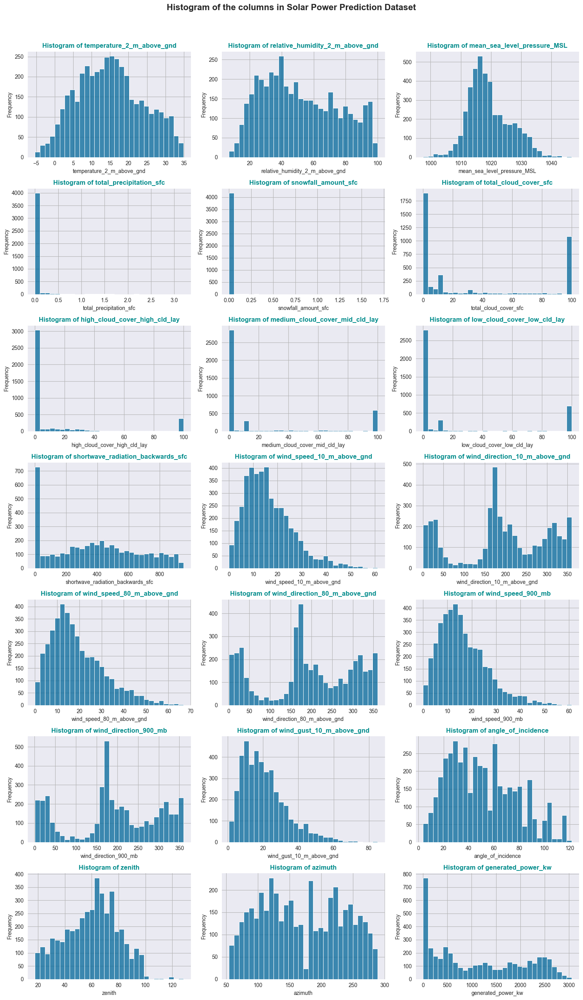

In [10]:

columns = df.columns[0:21]  
plt.figure(figsize=(15, 25)) 

sns.set_style("darkgrid", {"grid.color": ".7"})

for i, col in enumerate(columns, 1):
    plt.subplot(7, 3, i)  
    sns.histplot(data=df, x=col, bins=30,color = "#006699") 
    plt.title(f"Histogram of {col}" , color = "darkcyan", fontweight='bold')
    plt.xlabel(col)  
    plt.ylabel("Frequency")  

plt.suptitle("Histogram of the columns in Solar Power Prediction Dataset", 
             fontsize=16, 
             y=1.02, fontweight = 'bold',
             ha='center') 

plt.subplots_adjust(hspace=0., wspace=0.4)

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()

##### Bivariate Analysis

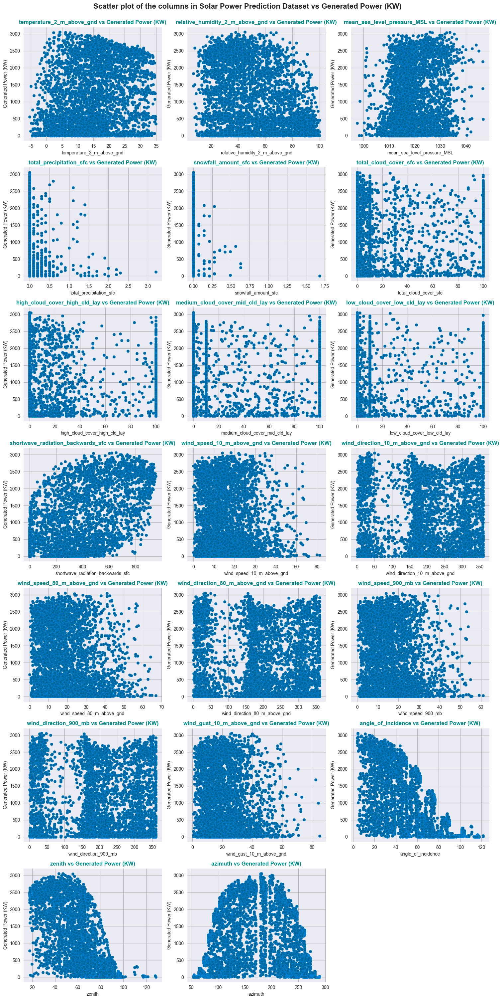

In [11]:
columns = df.columns[0:20]  
plt.figure(figsize=(15, 30))  


for i, col in enumerate(columns, 1):
    plt.subplot(7, 3, i)  
    sns.scatterplot(x=df[col], y = df["generated_power_kw"],color = "#006699",edgecolor="#008ae6") 
    plt.title(f"{col} vs Generated Power (KW)", color = "darkcyan", fontweight='bold')
    plt.xlabel(col)  
    plt.ylabel("Generated Power (KW)")  

plt.suptitle("Scatter plot of the columns in Solar Power Prediction Dataset vs Generated Power (KW)", 
             fontsize=16, 
             y=1,  # Adjust vertical position of the title
             ha='center',fontweight = "bold") 

plt.subplots_adjust(hspace=0.6, wspace=0.8)
plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()

##### Correlation Heatmap

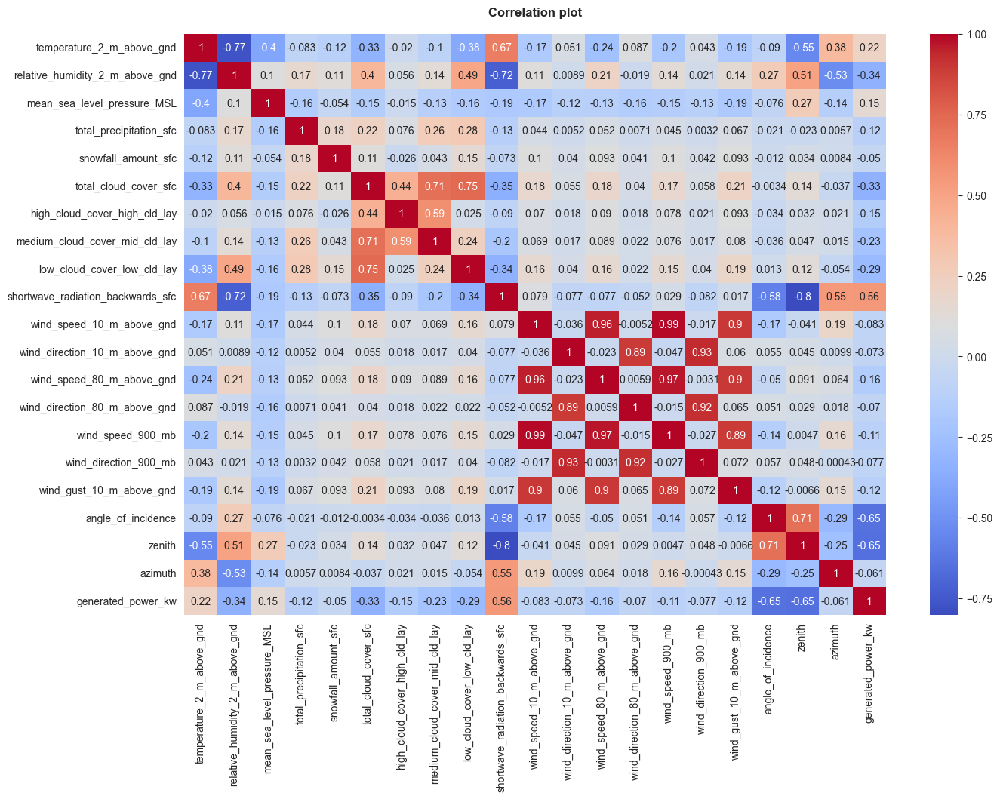

In [12]:
plt.figure(figsize = (15,10))
plt.title("Correlation plot", fontweight='bold',y=1.02)
sns.heatmap(df.corr(),cmap = "coolwarm",annot = True)
plt.show()

##### Data Summarization using Box plot 

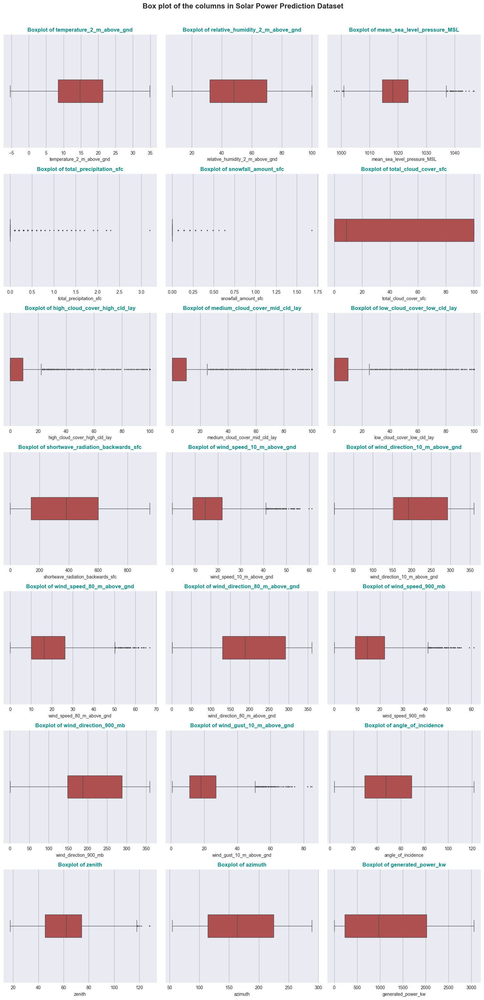

In [13]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Set a larger figure size to provide more space for the plots
plt.figure(figsize=(15, 30))

# Loop through each column in the DataFrame
columns = df.columns[0:21]
for i, column in enumerate(columns):
    plt.subplot(7, 3, i + 1)  # Use the 7x3 grid for 21 columns
    sns.boxplot(data=df, x=column, color="#bf4040", width=0.2, 
                flierprops=dict(marker='.', color='black', markersize=3))  # Adjust outlier size
    
    # Optionally, add titles for each boxplot
    plt.title(f"Boxplot of {column}",color = "darkcyan",fontweight = "bold")

# Adjust the layout and add more space between subplots
plt.subplots_adjust(hspace=0.8, wspace=0.5)
plt.tight_layout()

plt.suptitle("Box plot of the columns in Solar Power Prediction Dataset", 
             fontsize=16, 
             y=1.02,  # Adjust vertical position of the title
             ha='center',fontweight = "bold") 

# Display the plots
plt.show()

##### Multivariate Analysis

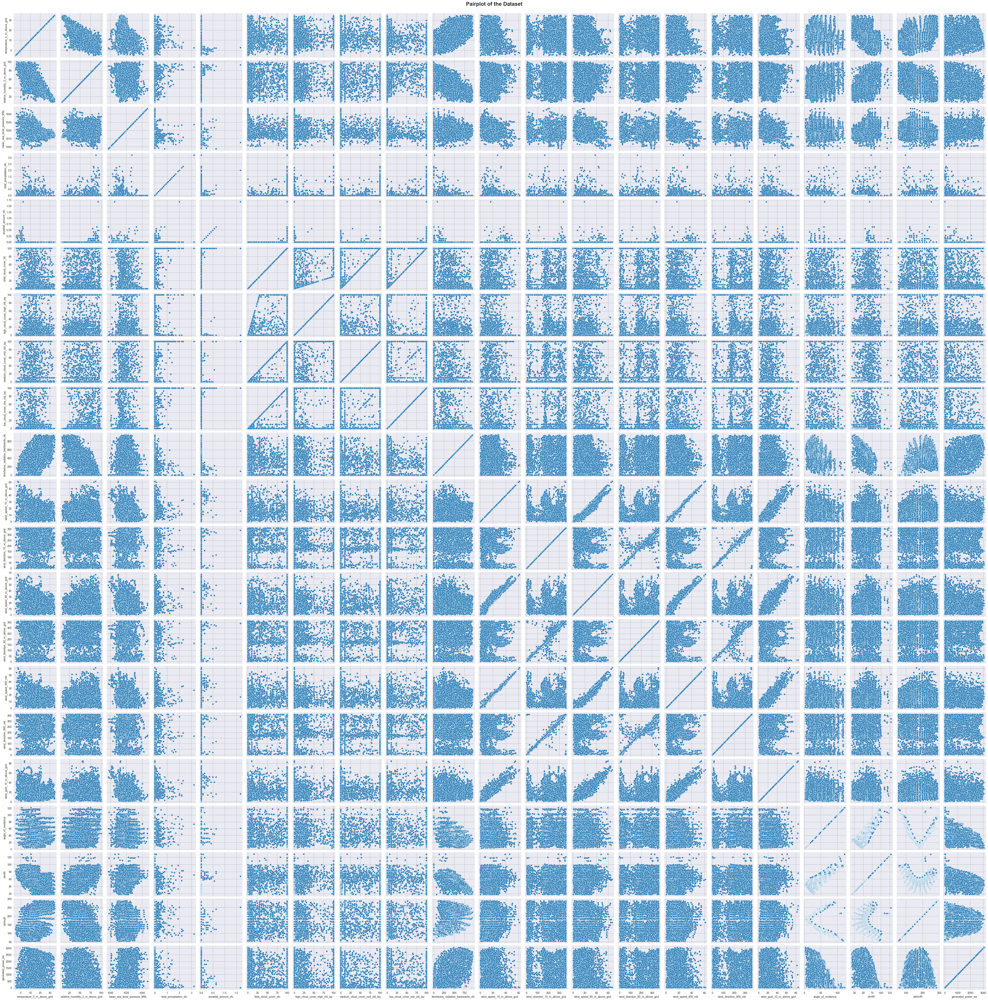

In [14]:
sns.pairplot(df,diag_kind = None)
plt.suptitle("Pairplot of the Dataset", fontweight="bold", fontsize=20, y=1)
plt.show()

##### **Linear Regression Model**

In [15]:
# Importing the libraries for building the linear regression model
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression 
from sklearn.metrics import mean_absolute_error

In [16]:
df.columns

Index(['temperature_2_m_above_gnd', 'relative_humidity_2_m_above_gnd',
       'mean_sea_level_pressure_MSL', 'total_precipitation_sfc',
       'snowfall_amount_sfc', 'total_cloud_cover_sfc',
       'high_cloud_cover_high_cld_lay', 'medium_cloud_cover_mid_cld_lay',
       'low_cloud_cover_low_cld_lay', 'shortwave_radiation_backwards_sfc',
       'wind_speed_10_m_above_gnd', 'wind_direction_10_m_above_gnd',
       'wind_speed_80_m_above_gnd', 'wind_direction_80_m_above_gnd',
       'wind_speed_900_mb', 'wind_direction_900_mb',
       'wind_gust_10_m_above_gnd', 'angle_of_incidence', 'zenith', 'azimuth',
       'generated_power_kw'],
      dtype='object')

In [17]:
# Split the dataset into Features and Target
X = df.drop("generated_power_kw",axis = 1)
y = df["generated_power_kw"]

In [18]:
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size = 0.2,random_state = 42)

In [19]:
# Scaling the X_train and X_test
scaler = StandardScaler()
Scaled_X_train = scaler.fit_transform(X_train)
Scaled_X_test = scaler.transform(X_test)


In [20]:
# Training the dataset with Linear Regression Model 
model = LinearRegression()
model.fit(Scaled_X_train, y_train)

LinearRegression()

##### **Linear Regression Model Evaluation**

In [21]:
# Evaluate the test dataset
y_pred_test = model.predict(Scaled_X_test)
mae_test = mean_absolute_error(y_test, y_pred_test)
print("Mean Absolute Error on Test Set using Linear Regression: ",mae_test)

Mean Absolute Error on Test Set using Linear Regression:  391.79269568403134


In [22]:
# Evaluate the train dataset
y_pred_train = model.predict(Scaled_X_train)
mae_train = mean_absolute_error(y_train, y_pred_train)
print("Mean Absolute Error on Train Set using Linear Regression: ",mae_train)

Mean Absolute Error on Train Set using Linear Regression:  392.42118159774026


##### **Linear Regression Model Prediction**

In [23]:
# Checking the first 10 test samples using Linear Regression
print("Actual and Predicted values using Linear Regression : \n")
for i in range(10):  
    print(f"Actual: {y_test.iloc[i]}, Predicted: {y_pred_test[i]}")

Actual and Predicted values using Linear Regression : 

Actual: 2511.2375, Predicted: 2005.3636217305739
Actual: 480.20512, Predicted: 433.0528263439055
Actual: 2017.5687, Predicted: 1609.5928418634242
Actual: 760.14012, Predicted: 180.47756243358106
Actual: 220.395, Predicted: 70.70040253733418
Actual: 25.226724, Predicted: -300.8591033851187
Actual: 0.056666667, Predicted: -353.1635417246707
Actual: 2497.5328, Predicted: 2441.341423244764
Actual: 514.64722, Predicted: 194.9747181436304
Actual: 916.91916, Predicted: 1328.108709624142


##### **Improvements on the Solar Power Prediction Project**

##### **Decision Tree Model**

In [24]:
# Import the module to build Regression Tree
from sklearn.tree import DecisionTreeRegressor

In [25]:
X = df.drop("generated_power_kw",axis = 1)
y = df["generated_power_kw"]

In [26]:
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size = 0.2,random_state = 42)

In [27]:
regressor_model = DecisionTreeRegressor(max_depth=4, random_state=42)
regressor_model.fit(X_train, y_train)

DecisionTreeRegressor(max_depth=4, random_state=42)

##### **Decision Tree Model Evaluation**

In [28]:
y_pred_test_regression = regressor_model.predict(X_test)
mse_regressor_test = mean_absolute_error(y_test, y_pred_test_regression)
print("Mean Absolute Error on Test set using Regression Tree : ",mse_regressor_test)

Mean Absolute Error on Test set using Regression Tree :  373.2188547022545


In [29]:
# Evaluate the train dataset
y_pred_train_regression = regressor_model.predict(X_train)
mae_regressor_train = mean_absolute_error(y_train, y_pred_train_regression)
print("Mean Absolute Error on Train set using Regression Tree: ",mae_regressor_train)

Mean Absolute Error on Train set using Regression Tree:  371.8905458857821


##### **Decision Tree Model Prediction**

In [30]:
# Checking the first 10 test samples using the Decision Tree
print("Actual and Predicted values using Decision Tree : \n")
for i in range(10):  
    print(f"Actual: {y_test.iloc[i]}, Predicted: {y_pred_test_regression[i]}")

Actual and Predicted values using Decision Tree : 

Actual: 2511.2375, Predicted: 1875.0782907065216
Actual: 480.20512, Predicted: 742.6881542337459
Actual: 2017.5687, Predicted: 1702.255877764706
Actual: 760.14012, Predicted: 533.2672109079191
Actual: 220.395, Predicted: 173.5076879117411
Actual: 25.226724, Predicted: 173.5076879117411
Actual: 0.056666667, Predicted: 49.96165895533803
Actual: 2497.5328, Predicted: 2321.0291309918725
Actual: 514.64722, Predicted: 233.98841248953894
Actual: 916.91916, Predicted: 1237.9953198245612


##### Decision Tree for Predicting the Solar Power 

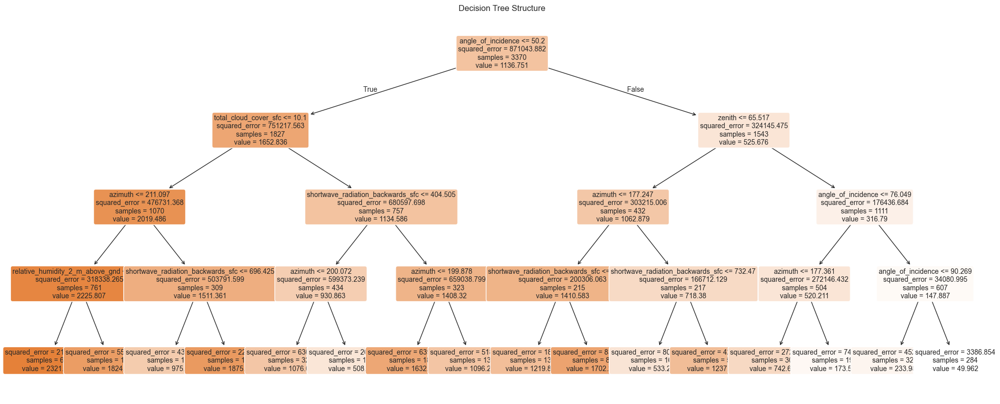

In [31]:
from sklearn.tree import plot_tree

# Visualizing decision tree

col = df.columns 
col = col[:-1]
plt.figure(figsize=(25, 10))
plot_tree(
    regressor_model,
    feature_names=col,
    filled=True,
    rounded=True,
    fontsize=10
)
plt.title("Decision Tree Structure")
plt.show()